# Unsupervised Clustering on Long Times-Series
Unsupervised learning on a long dataset can be useful to rip through data faster. In this notebook we will be going over a longer underwater acoustic dataset. The goal is to split and group the dataset based on similarity to label the data faster. In this notebook we will go over:

1) How to split up a long time series for quick analysis
2) Extracting features and reducing feature dimensionality
3) Examples of Unsupervised techniques to cluster similar sounds

By: Ryan McCarthy

In [1]:
import numpy as np
import pandas as pd
import sklearn as sk
import seaborn as sns
import matplotlib.pyplot as plt
from tqdm import tqdm
import os

import librosa 
import librosa.display
import IPython.display as ipd

from glob import glob

You will need to download the data from https://sanctsound.portal.axds.co/#sanctsound/method-types/sanctsounds/method-grouping/sounds-human-made/method/unknownanthro-sounds. This is a 4 minute recording of unknown anthropogenic noise that has some varying sounds.

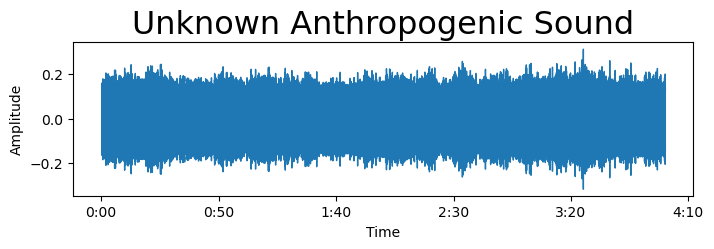

In [69]:
# Get Audio from the location
y,sr = librosa.load("anthropogenic_sounds/SanctSound_OC02_02_unknownanthro_20190815T233301Z.wav")

plt.figure(figsize = (8, 2))
librosa.display.waveshow(y = y, sr = sr);
plt.title("Unknown Anthropogenic Sound", fontsize = 23);
plt.ylabel('Amplitude')
plt.show()

In [70]:
# Play audio file
ipd.Audio(data=y,rate = sr)

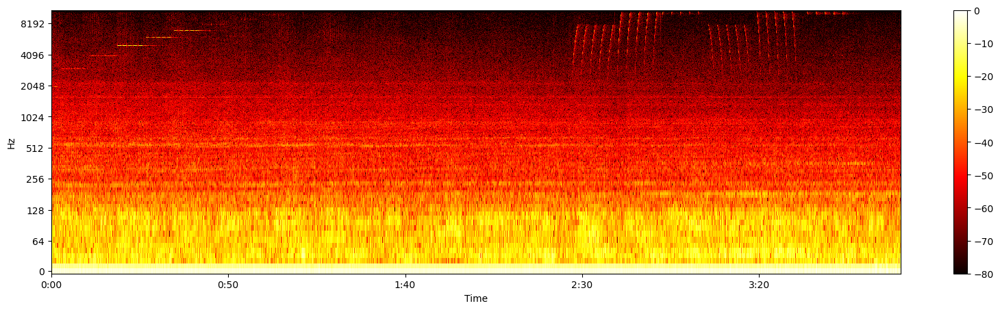

In [71]:
plt.figure(figsize = (20, 5))
# Default FFT window size
n_fft = 2048 # FFT window size
hop_length = 512 # number audio of frames between STFT columns (looks like a good default)

# Short-time Fourier transform (STFT)
D = np.abs(librosa.stft(y, n_fft = n_fft, hop_length = hop_length))

# Convert an amplitude spectrogram to Decibels-scaled spectrogram.
DB = librosa.amplitude_to_db(D, ref = np.max)

librosa.display.specshow(DB, sr = sr, hop_length = hop_length, x_axis = 'time', y_axis = 'log',
                        cmap = 'hot')
plt.colorbar();

In [72]:
Data_splits = []
step = sr*2
for times in range(0,len(y),step):
    Data_splits.append(y[times:times + step])
    
Data_splits = np.vstack(Data_splits)

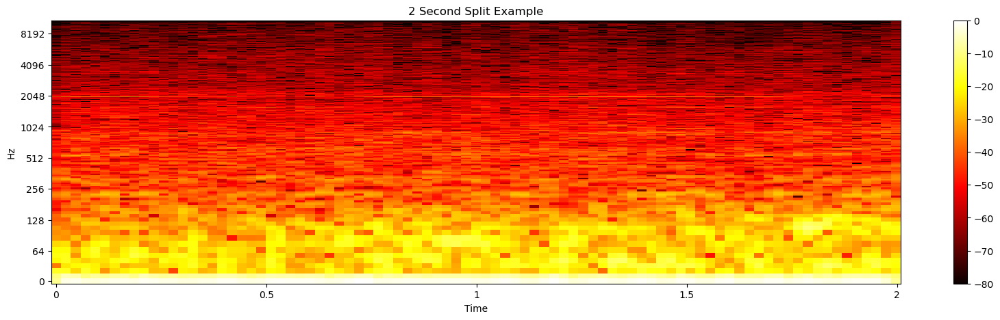

In [73]:
plt.figure(figsize = (20, 5))
# Default FFT window size
n_fft = 2048 # FFT window size
hop_length = 512 # number audio of frames between STFT columns (looks like a good default)

# Short-time Fourier transform (STFT)
D = np.abs(librosa.stft(Data_splits[0,:], n_fft = n_fft, hop_length = hop_length))

# Convert an amplitude spectrogram to Decibels-scaled spectrogram.
DB = librosa.amplitude_to_db(D, ref = np.max)

librosa.display.specshow(DB, sr = sr, hop_length = hop_length, x_axis = 'time', y_axis = 'log',
                        cmap = 'hot')
plt.colorbar();
plt.title('2 Second Split Example')
plt.show()

# Feature Extraction and Visualisation 

In [74]:
from sklearn.cluster import KMeans,AgglomerativeClustering
from sklearn.mixture import GaussianMixture
from sklearn.decomposition import PCA
from sklearn.metrics import silhouette_samples,silhouette_score
import matplotlib.cm as cm

In [101]:
features = []
for signal in Data_splits:
    D = np.abs(librosa.stft(signal, n_fft = n_fft, hop_length = hop_length))
    DB = librosa.amplitude_to_db(D, ref = np.max)
    features.append(np.mean(DB.T,axis=0))

features = np.vstack(features)
features = np.vstack(features)
pca = PCA()
pca.fit(features.T)
X = pca.components_.T

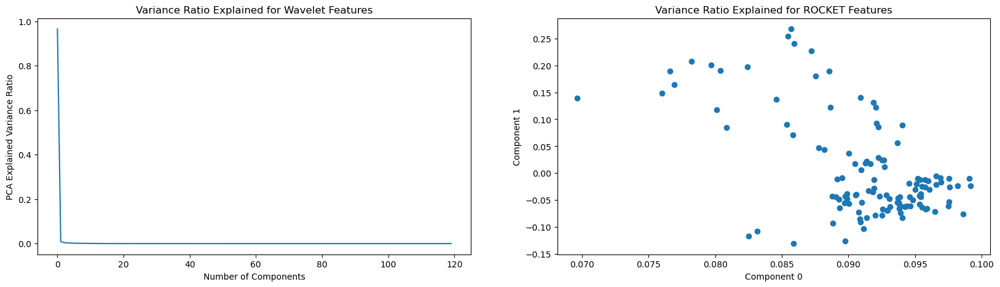

In [103]:
plt.figure(figsize = (20, 5))
plt.subplot(1,2,1)
plt.plot(pca.explained_variance_ratio_)
plt.ylabel("PCA Explained Variance Ratio")
plt.title("Variance Ratio Explained for Wavelet Features")
plt.xlabel("Number of Components")

plt.subplot(1,2,2)
plt.scatter(pca.components_[0,:],pca.components_[1,:])
plt.ylabel("Component 1")
plt.title("Variance Ratio Explained for ROCKET Features")
plt.xlabel("Component 0")
plt.show()

In [133]:
# select certain amount of components to use
X_reduced = X[:,0:3]

# Silhoutte Score Analysis

In [122]:
def cluster_silhoutte_plot(model,params):
    range_n_clusters = [2, 3, 4, 5, 6]

    for n_clusters in range_n_clusters:
        # Create a subplot with 1 row and 2 columns
        fig, (ax1, ax2) = plt.subplots(1, 2)
        fig.set_size_inches(10, 5)
    
        # The 1st subplot is the silhouette plot
        ax1.set_xlim([-0.1, 1])
        ax1.set_ylim([0, len(X_reduced) + (n_clusters + 1) * 10])
    
        # Initialize the clusterer with n_clusters value and a random generator
        # seed of 10 for reproducibility.
        if model == "kmeans":
            clusterer = KMeans(n_clusters=n_clusters,n_init=params["n_init"],random_state=params["random_state"])
        elif model == "gmm":
            clusterer = GaussianMixture(n_components=n_clusters,n_init=params["n_init"],random_state=params["random_state"])
        else:
            clusterer = AgglomerativeClustering(n_clusters,metric=params["metric"])
        cluster_labels = clusterer.fit_predict(X_reduced)
    
        # The silhouette_score gives the average value for all the samples.
        # This gives a perspective into the density and separation of the formed
        # clusters
        silhouette_avg = silhouette_score(X_reduced, cluster_labels)
        print("For n_clusters =",n_clusters,"The average silhouette_score is :",silhouette_avg,)
    
        # Compute the silhouette scores for each sample
        sample_silhouette_values = silhouette_samples(X_reduced, cluster_labels)
    
        y_lower = 10
        for i in range(n_clusters):
            # Aggregate the silhouette scores for samples belonging to
            # cluster i, and sort them
            ith_cluster_silhouette_values = sample_silhouette_values[cluster_labels == i]
    
            ith_cluster_silhouette_values.sort()
    
            size_cluster_i = ith_cluster_silhouette_values.shape[0]
            y_upper = y_lower + size_cluster_i
    
            color = cm.nipy_spectral(float(i) / n_clusters)
            ax1.fill_betweenx(np.arange(y_lower, y_upper),0,ith_cluster_silhouette_values,facecolor=color,edgecolor=color,alpha=0.7,)
    
            # Label the silhouette plots with their cluster numbers at the middle
            ax1.text(-0.05, y_lower + 0.5 * size_cluster_i, str(i))
    
            # Compute the new y_lower for next plot
            y_lower = y_upper + 10  # 10 for the 0 samples
    
        ax1.set_title("The silhouette plot for the various clusters.")
        ax1.set_xlabel("The silhouette coefficient values")
        ax1.set_ylabel("Cluster label")
    
        # The vertical line for average silhouette score of all the values
        ax1.axvline(x=silhouette_avg, color="red", linestyle="--")
    
        ax1.set_yticks([])  # Clear the yaxis labels / ticks
        ax1.set_xticks([-0.1, 0, 0.2, 0.4, 0.6, 0.8, 1])
    
        # 2nd Plot showing the actual clusters formed
        colors = cm.nipy_spectral(cluster_labels.astype(float) / n_clusters)
        ax2.scatter(X_reduced[:, 0], X_reduced[:, 1], marker=".", s=30, lw=0, alpha=0.7, c=colors, edgecolor="k")
    
        ax2.set_title("The visualization of the clustered data.")
        ax2.set_xlabel("Feature space for the 1st feature")
        ax2.set_ylabel("Feature space for the 2nd feature")
    
        plt.suptitle(f"Silhouette analysis for {clusterer.__class__.__name__} clustering on sample data with n_clusters = {n_clusters}",fontsize=14,fontweight="bold")
    
    plt.show()

C:\Users\ryan-\anaconda3\envs\audioenv\Lib\site-packages\sklearn\cluster\_kmeans.py:1429: UserWarning: KMeans is known to have a memory leak on Windows with MKL, when there are less chunks than available threads. You can avoid it by setting the environment variable OMP_NUM_THREADS=1.
  warnings.warn(
C:\Users\ryan-\anaconda3\envs\audioenv\Lib\site-packages\sklearn\cluster\_kmeans.py:1429: UserWarning: KMeans is known to have a memory leak on Windows with MKL, when there are less chunks than available threads. You can avoid it by setting the environment variable OMP_NUM_THREADS=1.
  warnings.warn(
C:\Users\ryan-\anaconda3\envs\audioenv\Lib\site-packages\sklearn\cluster\_kmeans.py:1429: UserWarning: KMeans is known to have a memory leak on Windows with MKL, when there are less chunks than available threads. You can avoid it by setting the environment variable OMP_NUM_THREADS=1.
  warnings.warn(
C:\Users\ryan-\anaconda3\envs\audioenv\Lib\site-packages\sklearn\cluster\_kmeans.py:1429: User

For n_clusters = 2 The average silhouette_score is : 0.52052337
For n_clusters = 3 The average silhouette_score is : 0.60471064
For n_clusters = 4 The average silhouette_score is : 0.6155634
For n_clusters = 5 The average silhouette_score is : 0.46316898
For n_clusters = 6 The average silhouette_score is : 0.48014867


C:\Users\ryan-\anaconda3\envs\audioenv\Lib\site-packages\sklearn\cluster\_kmeans.py:1429: UserWarning: KMeans is known to have a memory leak on Windows with MKL, when there are less chunks than available threads. You can avoid it by setting the environment variable OMP_NUM_THREADS=1.
  warnings.warn(


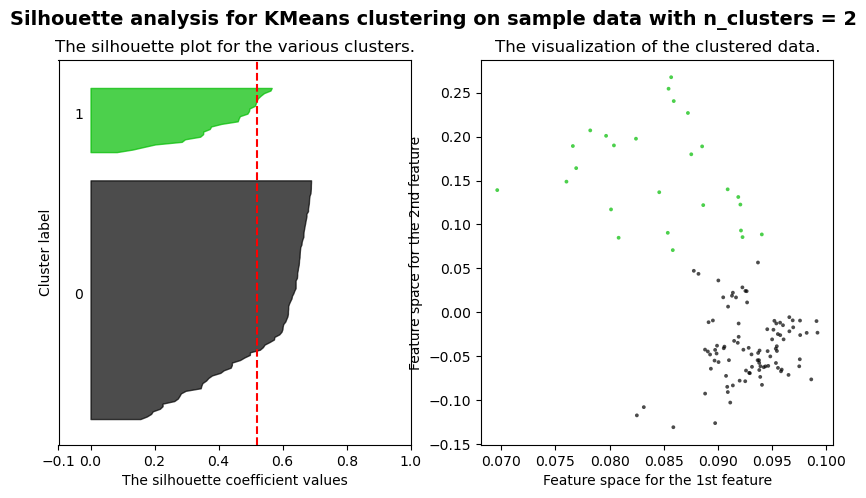

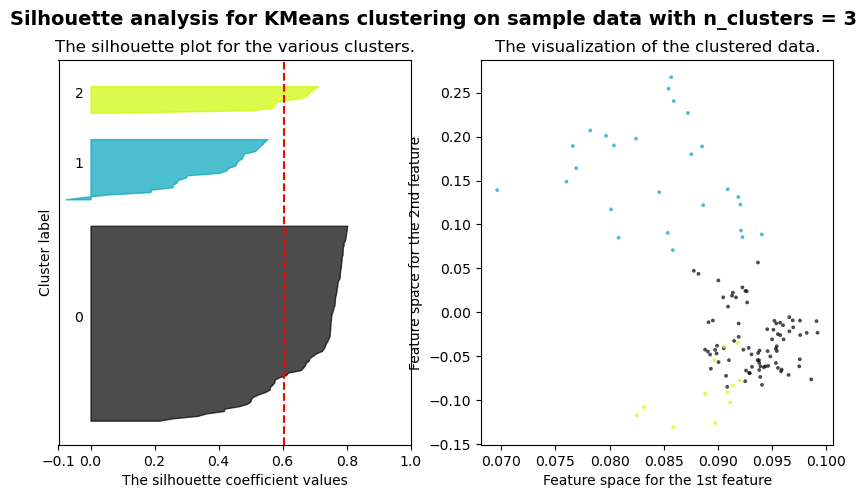

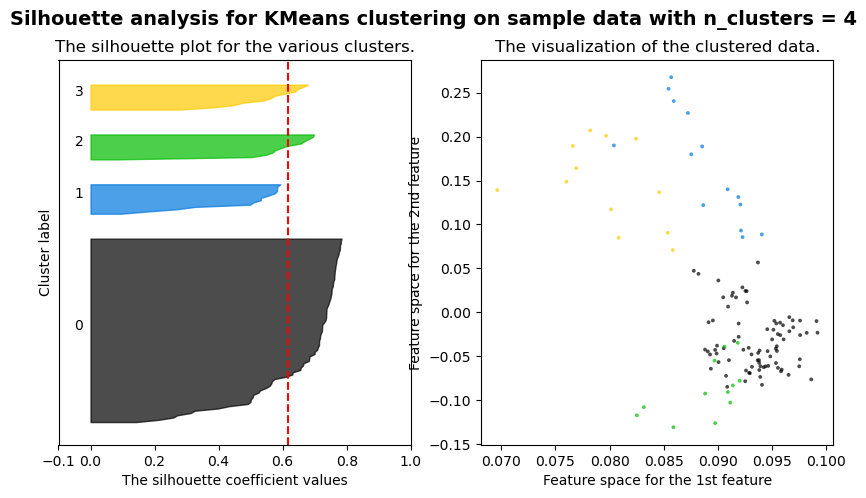

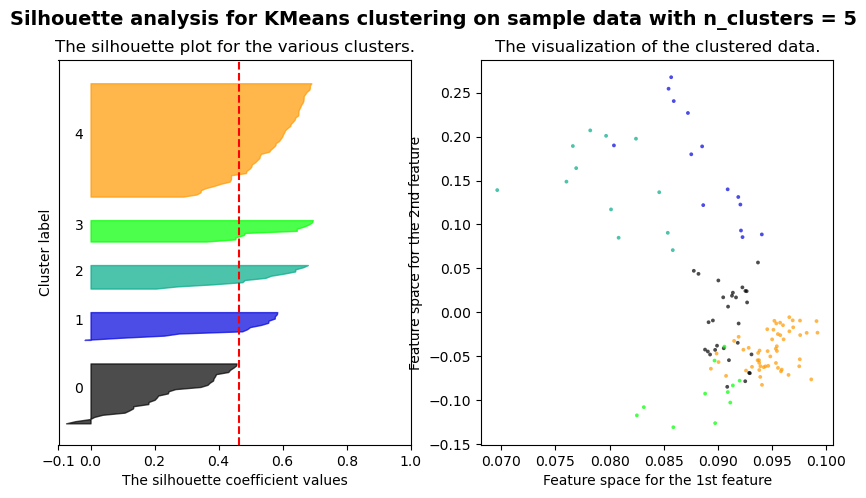

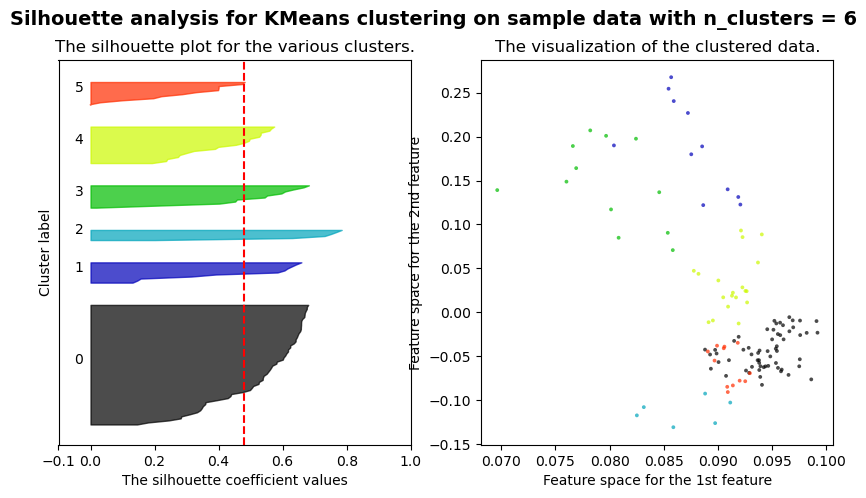

In [123]:
cluster_silhoutte_plot("kmeans",params = {"n_init":6,"random_state":42})

C:\Users\ryan-\anaconda3\envs\audioenv\Lib\site-packages\sklearn\cluster\_kmeans.py:1429: UserWarning: KMeans is known to have a memory leak on Windows with MKL, when there are less chunks than available threads. You can avoid it by setting the environment variable OMP_NUM_THREADS=1.
  warnings.warn(
C:\Users\ryan-\anaconda3\envs\audioenv\Lib\site-packages\sklearn\cluster\_kmeans.py:1429: UserWarning: KMeans is known to have a memory leak on Windows with MKL, when there are less chunks than available threads. You can avoid it by setting the environment variable OMP_NUM_THREADS=1.
  warnings.warn(
C:\Users\ryan-\anaconda3\envs\audioenv\Lib\site-packages\sklearn\cluster\_kmeans.py:1429: UserWarning: KMeans is known to have a memory leak on Windows with MKL, when there are less chunks than available threads. You can avoid it by setting the environment variable OMP_NUM_THREADS=1.
  warnings.warn(
C:\Users\ryan-\anaconda3\envs\audioenv\Lib\site-packages\sklearn\cluster\_kmeans.py:1429: User

For n_clusters = 2 The average silhouette_score is : 0.5046369
For n_clusters = 3 The average silhouette_score is : 0.60471064
For n_clusters = 4 The average silhouette_score is : 0.41836494
For n_clusters = 5 The average silhouette_score is : 0.45882308


C:\Users\ryan-\anaconda3\envs\audioenv\Lib\site-packages\sklearn\cluster\_kmeans.py:1429: UserWarning: KMeans is known to have a memory leak on Windows with MKL, when there are less chunks than available threads. You can avoid it by setting the environment variable OMP_NUM_THREADS=1.
  warnings.warn(
C:\Users\ryan-\anaconda3\envs\audioenv\Lib\site-packages\sklearn\cluster\_kmeans.py:1429: UserWarning: KMeans is known to have a memory leak on Windows with MKL, when there are less chunks than available threads. You can avoid it by setting the environment variable OMP_NUM_THREADS=1.
  warnings.warn(
C:\Users\ryan-\anaconda3\envs\audioenv\Lib\site-packages\sklearn\cluster\_kmeans.py:1429: UserWarning: KMeans is known to have a memory leak on Windows with MKL, when there are less chunks than available threads. You can avoid it by setting the environment variable OMP_NUM_THREADS=1.
  warnings.warn(
C:\Users\ryan-\anaconda3\envs\audioenv\Lib\site-packages\sklearn\cluster\_kmeans.py:1429: User

For n_clusters = 6 The average silhouette_score is : 0.40494245


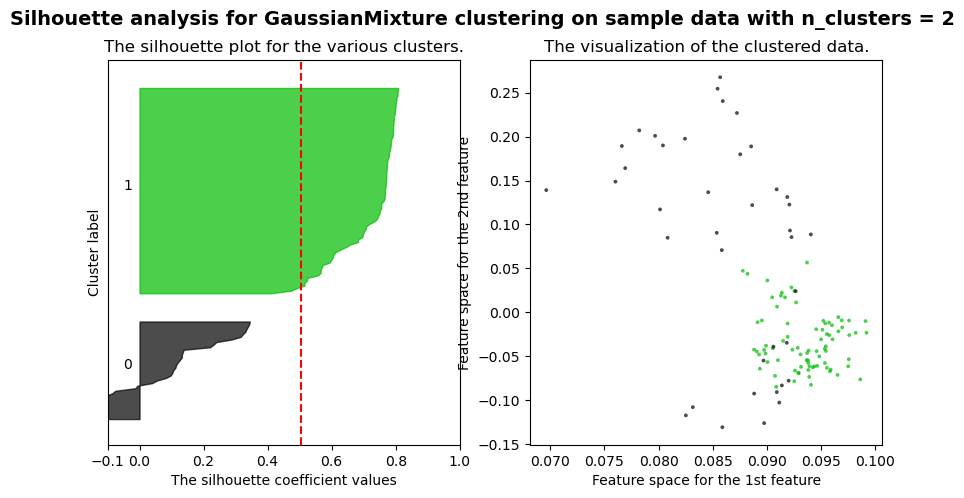

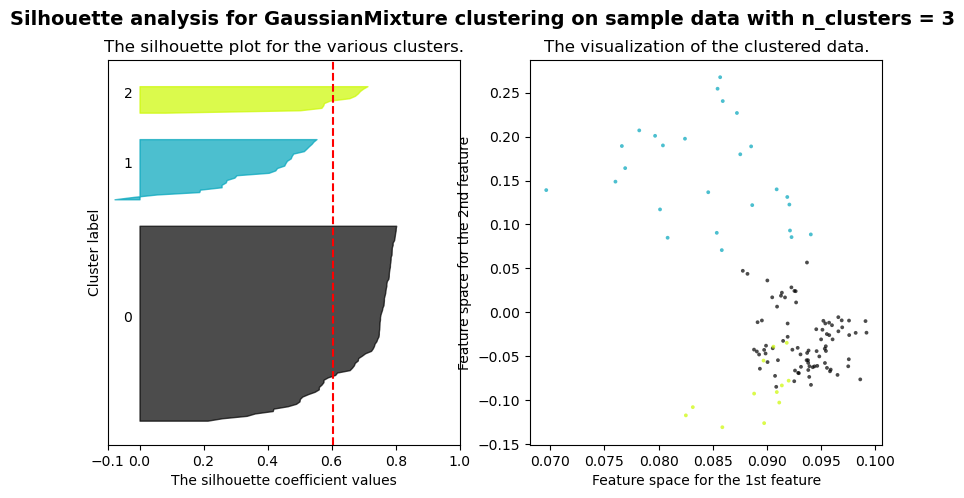

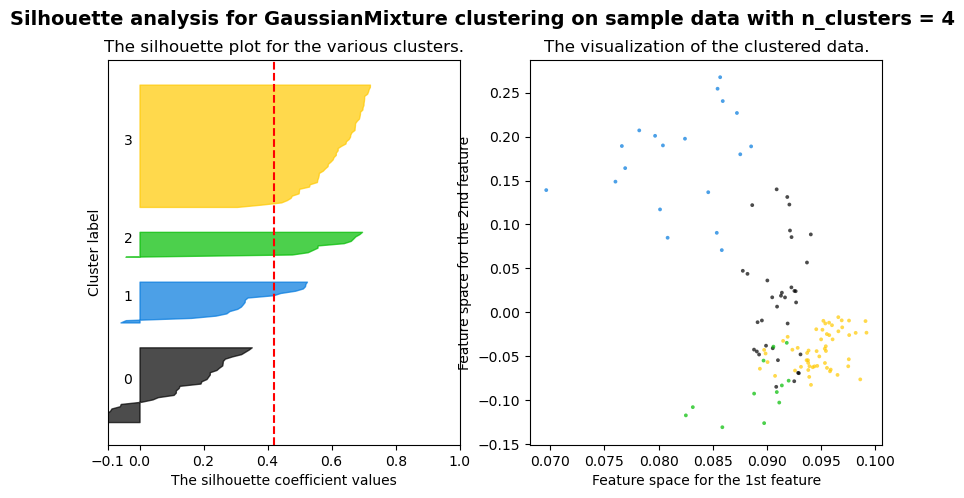

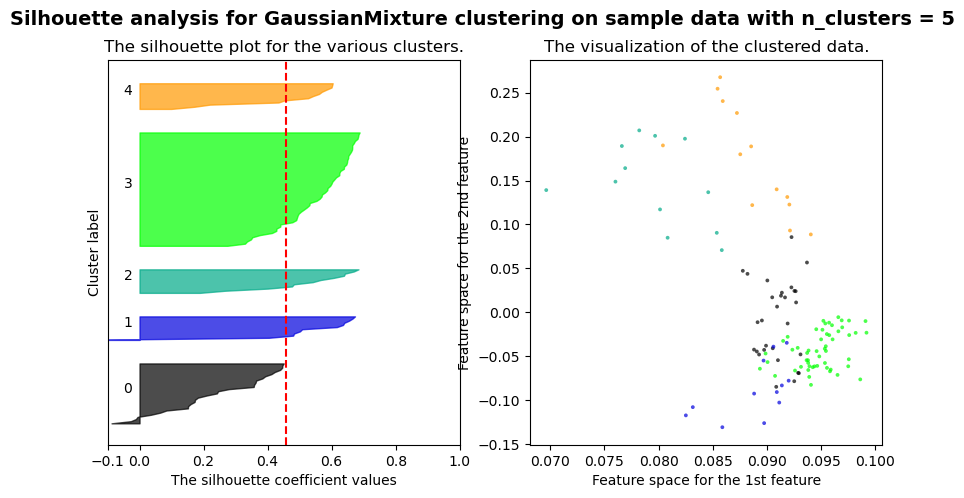

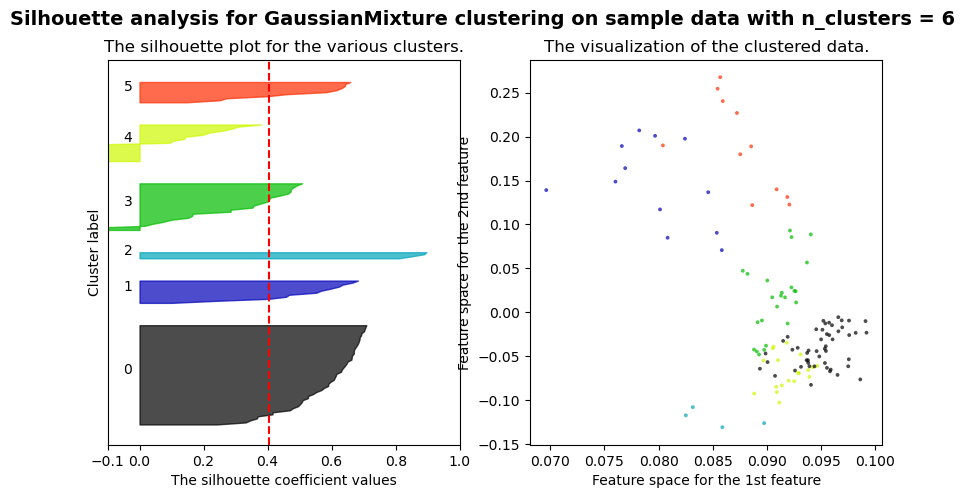

In [124]:
cluster_silhoutte_plot("gmm",params = {"n_init":6,"random_state":42})

For n_clusters = 2 The average silhouette_score is : 0.52052337
For n_clusters = 3 The average silhouette_score is : 0.604348
For n_clusters = 4 The average silhouette_score is : 0.6142588
For n_clusters = 5 The average silhouette_score is : 0.46316898
For n_clusters = 6 The average silhouette_score is : 0.462835


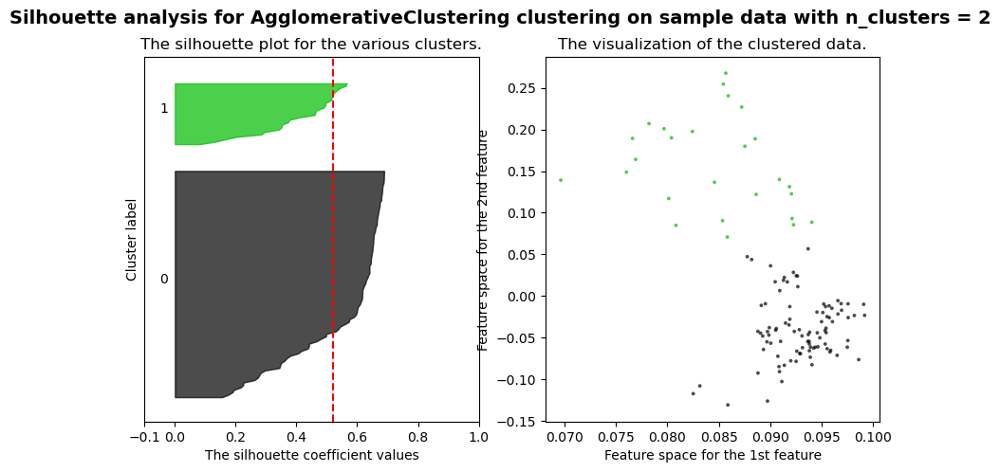

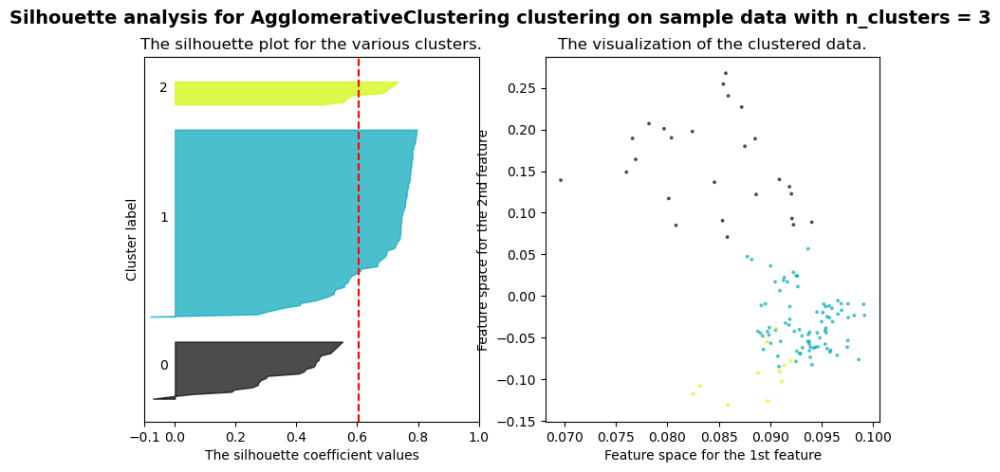

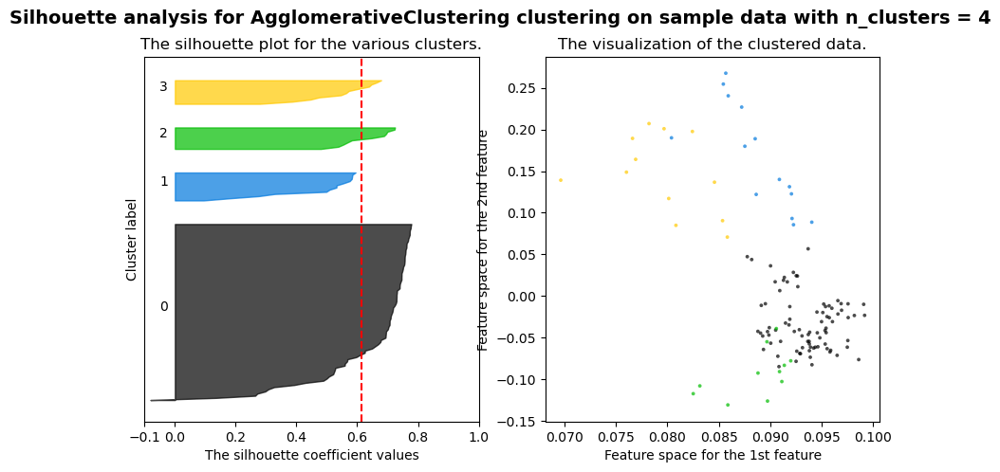

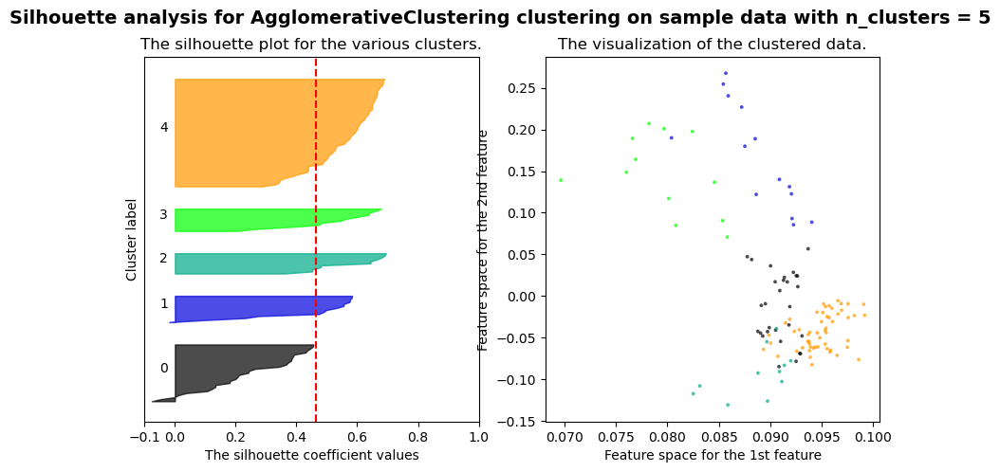

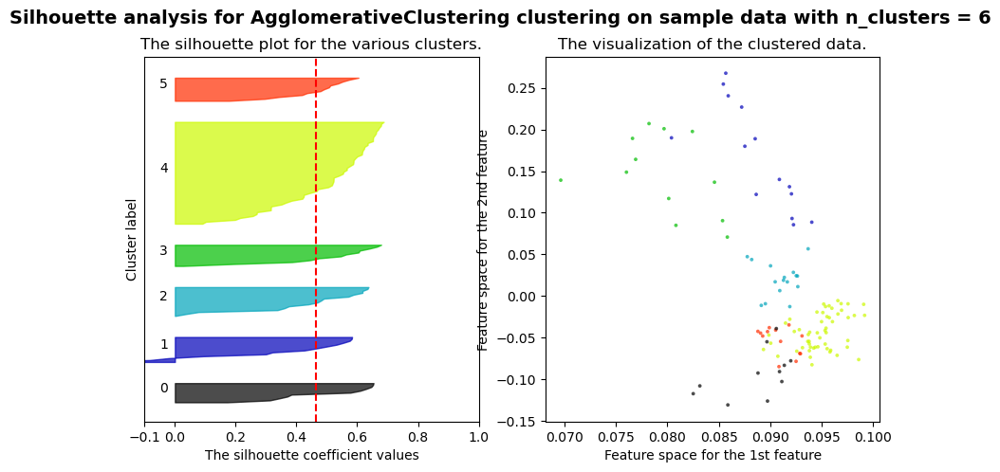

In [125]:
cluster_silhoutte_plot("",params = {"metric":"euclidean"})

# Clusters to Spectrogram

In [126]:
# Create models with n clusters
numgroups = 6
kmeansclust = KMeans(n_clusters=numgroups,n_init=6,random_state=42)
gmmclust = GaussianMixture(n_components=numgroups,n_init=6,random_state=42)
hierclust = AgglomerativeClustering(n_clusters=numgroups)

idxkmean = kmeansclust.fit_predict(X_reduced)
idxgmm = gmmclust.fit_predict(X_reduced)
idxhier = hierclust.fit_predict(X_reduced)

idxkmean_expanded = np.repeat(idxkmean,2*sr)
idxgmm_expanded = np.repeat(idxgmm,2*sr)
idxhier_expanded = np.repeat(idxhier,2*sr)

C:\Users\ryan-\anaconda3\envs\audioenv\Lib\site-packages\sklearn\cluster\_kmeans.py:1429: UserWarning: KMeans is known to have a memory leak on Windows with MKL, when there are less chunks than available threads. You can avoid it by setting the environment variable OMP_NUM_THREADS=1.
  warnings.warn(
C:\Users\ryan-\anaconda3\envs\audioenv\Lib\site-packages\sklearn\cluster\_kmeans.py:1429: UserWarning: KMeans is known to have a memory leak on Windows with MKL, when there are less chunks than available threads. You can avoid it by setting the environment variable OMP_NUM_THREADS=1.
  warnings.warn(
C:\Users\ryan-\anaconda3\envs\audioenv\Lib\site-packages\sklearn\cluster\_kmeans.py:1429: UserWarning: KMeans is known to have a memory leak on Windows with MKL, when there are less chunks than available threads. You can avoid it by setting the environment variable OMP_NUM_THREADS=1.
  warnings.warn(
C:\Users\ryan-\anaconda3\envs\audioenv\Lib\site-packages\sklearn\cluster\_kmeans.py:1429: User

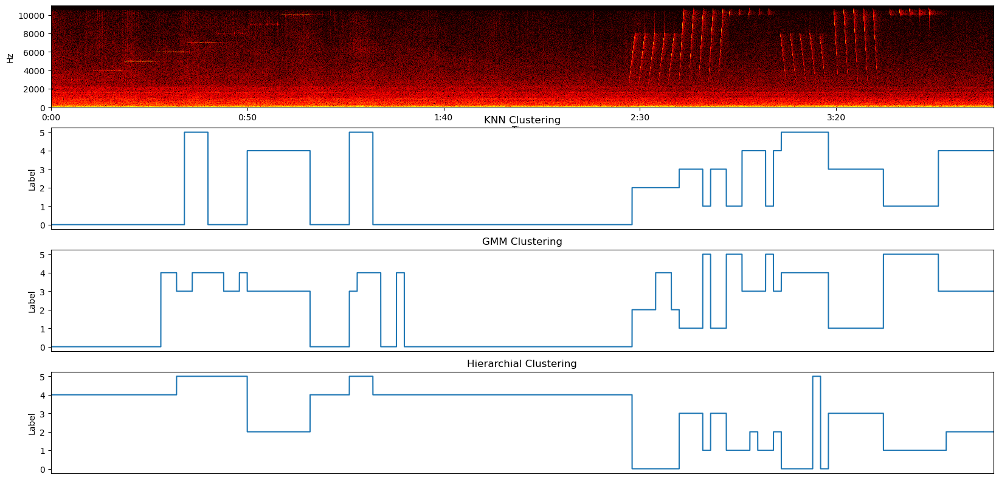

In [127]:
# Plot spectrogram
plt.figure(figsize = (20, 10))

# Default FFT window size
n_fft = 2048 # FFT window size
hop_length = 512 # number audio of frames between STFT columns (looks like a good default)

# Short-time Fourier transform (STFT)
D = np.abs(librosa.stft(y, n_fft = n_fft, hop_length = hop_length))

# Convert an amplitude spectrogram to Decibels-scaled spectrogram.
DB = librosa.amplitude_to_db(D, ref = np.max)

plt.subplot(4,1,1)
librosa.display.specshow(DB, sr = sr, hop_length = hop_length, x_axis = 'time', y_axis = 'linear',
                        cmap = 'hot',)

plt.subplot(4,1,2)
plt.plot(idxkmean_expanded)
plt.ylabel('Label')
plt.ylabel('Label')
plt.xticks([])
plt.title('KNN Clustering')
plt.autoscale(enable=True, axis='x', tight=True)

plt.subplot(4,1,3)
plt.plot(idxgmm_expanded)
plt.ylabel('Label')
plt.ylabel('Label')
plt.xticks([])
plt.title('GMM Clustering')
plt.autoscale(enable=True, axis='x', tight=True)

plt.subplot(4,1,4)
plt.plot(idxhier_expanded)
plt.ylabel('Label')
plt.ylabel('Label')
plt.xticks([])
plt.title('Hierarchial Clustering')
plt.autoscale(enable=True, axis='x', tight=True)

plt.show()

The above plot shows the groupings that are formed from the three different methods. Although there are some inaccauracies in how the sound is clustered, it gives an initial grouping of the data that can help go through the data faster. Next we will take a few examples of each of the classes.

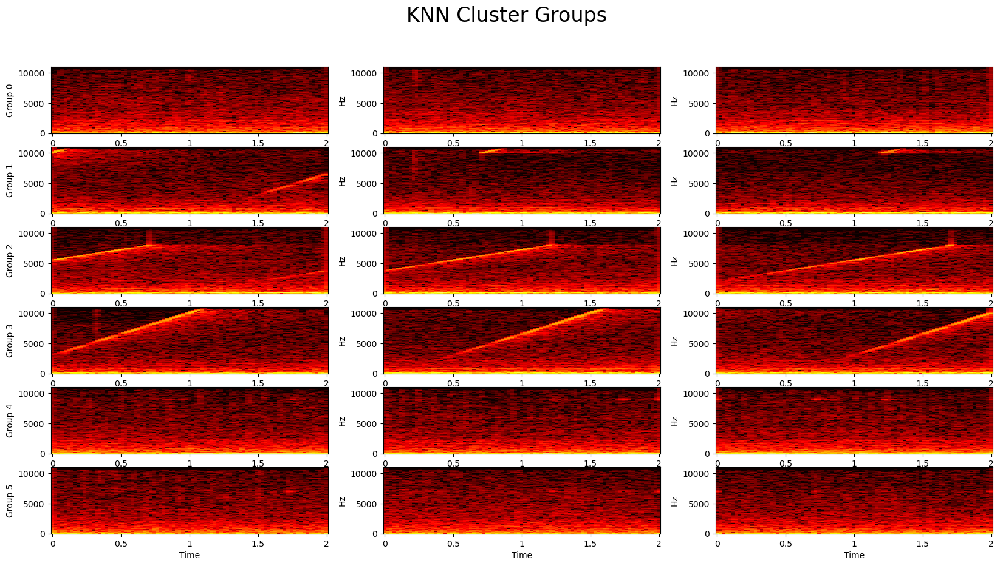

In [132]:
plt.figure(figsize = (20, 10))
# Default FFT window size
n_fft = 2048 # FFT window size
hop_length = 512 # number audio of frames between STFT columns (looks like a good default)

it = 1
for group in range(numgroups):
    tr = idxkmean == group
    tempgroups = Data_splits[tr,:]
    
    for samplegroup in range(0,3):
        # Short-time Fourier transform (STFT)
        D = np.abs(librosa.stft(tempgroups[samplegroup,:], n_fft = n_fft, hop_length = hop_length))
        
        # Convert an amplitude spectrogram to Decibels-scaled spectrogram.
        DB = librosa.amplitude_to_db(D, ref = np.max)
        
        plt.subplot(numgroups,3,it)
        librosa.display.specshow(DB, sr = sr, hop_length = hop_length, x_axis = 'time', y_axis = 'linear',
                                cmap = 'hot',)
        if (it-1)%3==0:
            plt.ylabel(f"Group {group}")
        it +=1

    plt.suptitle("KNN Cluster Groups",fontsize=24)

# Citations